In [2]:
#imports
%matplotlib inline

from PIL import Image
import urllib, cStringIO
import random

from astropy.io import fits as pyfits
from astropy.table import Table,join
import numpy as np
import os
from astropy.io.fits import Column
from datetime import datetime
from operator import itemgetter
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
plt.rcParams['text.usetex']=True

#function for getting galaxy images
def get_image_from_url(url):

    file = cStringIO.StringIO(urllib.urlopen(url).read())
    img = Image.open(file)
    return img

#table of galaxies - vote fractions and urls for getting images. 
data=Table.read('gzh_3_23_with_urls.fits')

#current threshold values:
cuts=Table.read('gzh_cuts.fits')
p_features_cut = cuts['p_features_cut'][0]
p_clumpy_yes_cut = cuts['p_clumpy_yes_cut'][0]

# Task 13: Is there one clump that is clearly brighter than the others?
Previous task: 

Task 01: Is the galaxy smooth or featured? (need to answer features)

Task 12: Does the galaxy have a mostly clumpy appearance? (need to answer yes)

Task 16: How many clumps are there? (need to answer anything except 1)

In [3]:
#Clumpy question. Previous task: smooth_or_features. 

#First define the task in question:
p_bright_clump_yes = 't13_bright_clump_a01_yes_weighted_fraction' # vote fraction for task
N_bright_clump = 't13_bright_clump_total_weight' # number of votes for task
#and the previous task:
p_features = 't01_smooth_or_features_a02_features_or_disk_best_fraction' # vote fraction for previous task
p_clumpy_yes = 't12_clumpy_a01_yes_weighted_fraction'
p_one_clump = 't16_clumps_count_a01_1_weighted_fraction'

#how many minimum votes to be confident in vote fraction: 
N_cut = 20
min_N = (data[N_bright_clump]>=N_cut) 

# calculate average p_task in bins of p_prev_task, with width of dp = 0.1
p_prev_task_list = np.linspace(.05,.95,11)

featured = (data[p_features]>p_features_cut)
clumpy = (data[p_clumpy_yes]>p_clumpy_yes_cut)

fraction_list=[]
err_list=[]
std_list=[]
for p in p_prev_task_list:
    task_data = (data[p_one_clump]>p-.05) & (data[p_one_clump]<p+.05) & featured & clumpy & min_N

    #compute the average p_task in this bin
    N_in_bin = len(data[task_data])
    if N_in_bin>0:
        fraction_list.append(np.nanmean(data[task_data][p_bright_clump_yes]))
    else:
        fraction_list.append(np.nan)
    try:
        err_list.append(np.nanstd(data[task_data][p_bright_clump_yes])/np.sqrt(N_in_bin))
    except TypeError:
        err_list.append(0)
        
y1 = [f+e for f,e in zip(fraction_list,err_list)]
y2 = [f-e for f,e in zip(fraction_list,err_list)]


/usr/local/lib/python2.7/dist-packages/numpy/lib/nanfunctions.py:1136: RuntimeWarning: Degrees of freedom <= 0 for slice.
  warnings.warn("Degrees of freedom <= 0 for slice.", RuntimeWarning)


(0, 1)

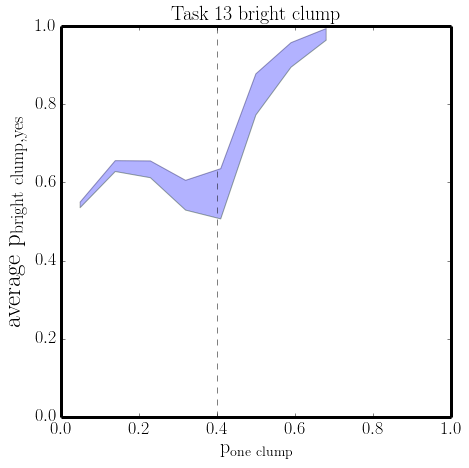

In [11]:
# plot how clumpy fraction is affected by previous question

p_one_clump_cut = .4

plt.rcParams['axes.linewidth'] = 3
plt.rcParams['xtick.labelsize'] = 18
plt.rcParams['ytick.labelsize'] = 18 

f=plt.figure(figsize=(7,7))

plt.plot(p_prev_task_list,y1,alpha=.1)
plt.plot(p_prev_task_list,y2,alpha=.1)
plt.fill_between(p_prev_task_list,y1,y2,alpha=.3)

plt.ylabel(r'$\mathrm{average~p_{bright~clump,yes}}$',fontsize=25)
plt.xlabel(r'$\mathrm{p_{one~clump}}$',fontsize=20)
plt.title(r'$\mathrm{Task~13~bright~clump}$',fontsize=20)
plt.axvline(x=p_one_clump_cut,ls='dashed',color='k',alpha=.5)
plt.xlim(0,1)
plt.ylim(0,1)

## Below: Visually inspect galaxies for "bright clump candidates" - galaxies for which asking this question makes physical sense. These should be clumpy galaxies with more than one clump.

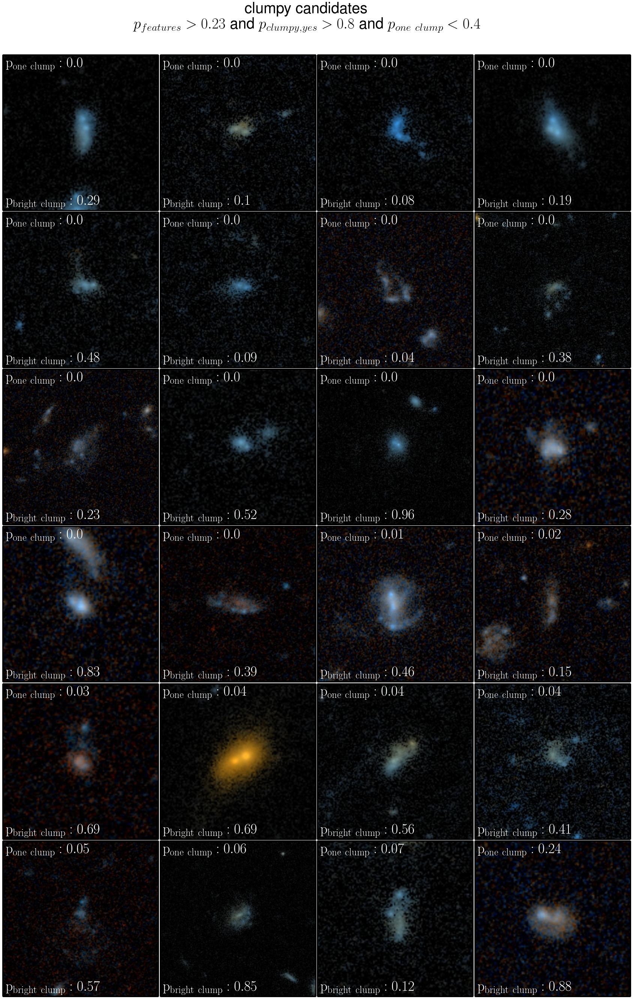

In [12]:
more_than_one_clump=(data[p_one_clump]<p_one_clump_cut)

gs=gridspec.GridSpec(6,4)
gs.update(wspace=0.01)
gs.update(hspace=0.01)
 
data_criteria= featured & clumpy & more_than_one_clump & min_N
these_data=data[data_criteria]

if len(these_data) < 20:
    print 'try new values'

#shuffle which galaxies get displayed     
n_list=np.linspace(0,len(these_data)-1,len(these_data))
random.shuffle(n_list)

#how many galaxies to display?
n_gals = 24
random_n_list = n_list[0:n_gals]

random_gal_list = []
for n in random_n_list:
    random_gal_list.append(these_data[int(n)])

#now we have a random list of galaxies - sort them by p_one_clump, column 149
random_gal_list.sort(key=itemgetter(149))

f=plt.figure(figsize=(30,45))
n=0
for i in range (0,6):
    for j in range(0,4):
        ax=plt.subplot(gs[i,j])
        gal = random_gal_list[n] # random galaxy from big list 
        plt.imshow(get_image_from_url(gal['location']))
        plt.tick_params(labelbottom='off',labelleft='off')
        ax.annotate('$\mathrm{p_{one~clump}: %s}$'%round(gal[p_one_clump],2),fontsize=38,xy=(0.02,.97),
            xycoords='axes fraction',verticalalignment='top',color='white')

        ax.annotate('$\mathrm{p_{bright~clump}: %s}$'%round(gal[p_bright_clump_yes],2),fontsize=38,xy=(0.02,0.02),
            xycoords='axes fraction',color='white')

        n+=1
        

f.text(.5,.92,'clumpy candidates\n$p_{features} > %s$ and $p_{clumpy,yes}>%s$ and $p_{one~clump}<%s$'%(p_features_cut,p_clumpy_yes_cut,p_one_clump_cut), fontsize=40,ha='center')





## Below: The control sample; galaxies for which asking the bright clump question does *not* make sense. These should have one clump.

TypeError: not all arguments converted during string formatting

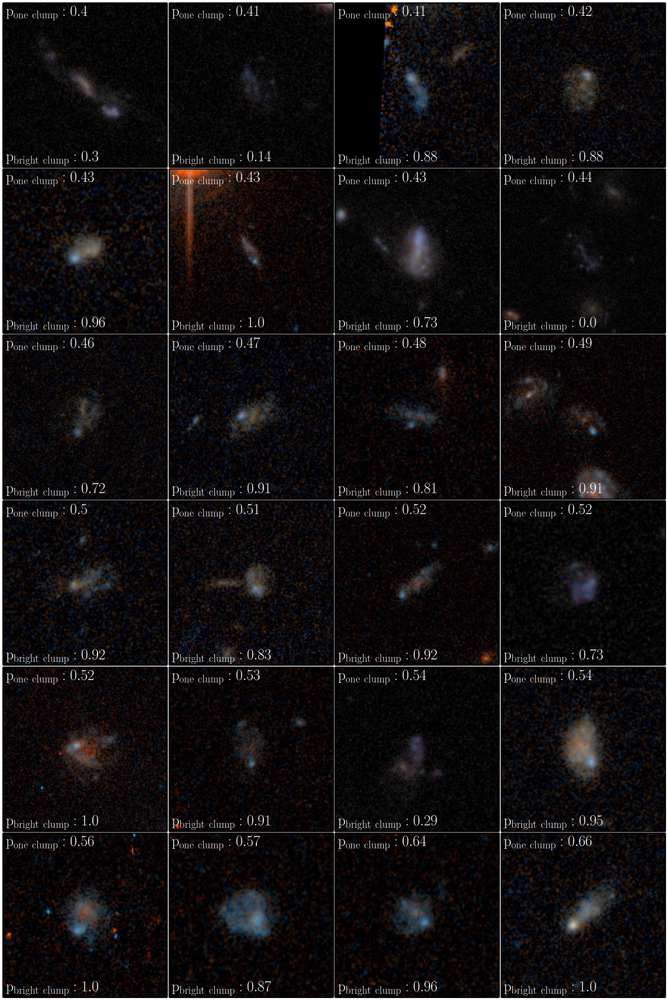

In [13]:
one_clump=(data[p_one_clump]>p_one_clump_cut)

gs=gridspec.GridSpec(6,4)
gs.update(wspace=0.01)
gs.update(hspace=0.01)
 
data_criteria= featured & clumpy & one_clump & min_N
these_data=data[data_criteria]

if len(these_data) < 20:
    print 'try new values'

#shuffle which galaxies get displayed     
n_list=np.linspace(0,len(these_data)-1,len(these_data))
random.shuffle(n_list)

#how many galaxies to display?
n_gals = 24
random_n_list = n_list[0:n_gals]

random_gal_list = []
for n in random_n_list:
    random_gal_list.append(these_data[int(n)])

#now we have a random list of galaxies - sort them by p_one_clump, column 149
random_gal_list.sort(key=itemgetter(149))

f=plt.figure(figsize=(30,45))
n=0
for i in range (0,6):
    for j in range(0,4):
        ax=plt.subplot(gs[i,j])
        gal = random_gal_list[n] # random galaxy from big list 
        plt.imshow(get_image_from_url(gal['location']))
        plt.tick_params(labelbottom='off',labelleft='off')
        ax.annotate('$\mathrm{p_{one~clump}: %s}$'%round(gal[p_one_clump],2),fontsize=38,xy=(0.02,.97),
            xycoords='axes fraction',verticalalignment='top',color='white')

        ax.annotate('$\mathrm{p_{bright~clump}: %s}$'%round(gal[p_bright_clump_yes],2),fontsize=38,xy=(0.02,0.02),
            xycoords='axes fraction',color='white')

        n+=1
        

f.text(.5,.92,'Control Sample: non-clumpy candidates\n$p_{features} > %s$ and $p_{clumpy,yes}>%s$ and $p_{one~clump}>$'%(p_features_cut,p_clumpy_yes_cut,p_one_clump_cut), fontsize=40,ha='center')





## Galaxies with $p_{one clump}$< 0.4 and $N_{bright clump}$>20 are good candidates for evaluating the bright clump question. Update cuts table with this value:

In [14]:
cuts['p_one_clump_cut']=p_one_clump_cut

newtable = cuts.copy(copy_data=True)
fname = 'gzh_cuts.fits'
if os.path.exists(fname):
    os.remove(fname)
newtable.write(fname,format='fits')